# RETrace2 methylation pipeline infers cell type with minimal number of CpGs.
- Single cell test samples are randomly selected from Liu et al. 2023 and preprocessed by intersecting with retrace2 pseudobulk data
- Reference cell type pseudobulk data from Liu et al.2023 are processed by aggregating single cell samples and intersecting with ChromHMM mTSS, mEnhA, mEnhWk, mBivProm states regions
- Pariwise dissimilarity matrix is calculated by running */RETrace2/modules/infer_celltype/calculate_pd_matrix_batched.py*


In [1]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import re

In [2]:
# Load pairwise dissimilarity matrix
pd_matrix_file = '/home/tcheng/Projects/RETrace/Methylation_ref/Test_data/Liu2023_Brain/2_calc_pd_matrix/test_pd_matrix_intersect_retrace2_ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm_5cells_v2/pairwise_dissimilarity_matrix.csv'
pd_matrix = pd.read_csv(pd_matrix_file, index_col=0)

# Split by downsample size

In [3]:
patterns = ['100', '300', '500', '1000', '3000', '5000', '10000', '30000']
split_dfs = {}

for pattern in patterns:
    mask = pd_matrix.index.str.contains(f'_{pattern}\\b', case=False) # use word boundary to ensure exact match
    split_dfs[pattern] = pd_matrix[mask]


# Convert GSM ID to cell type name

In [4]:
metadata = pd.read_csv('/home/tcheng/Projects/RETrace/Methylation_ref/Liu2023_Brain_processing/0_Download/merged_metadata.csv', index_col=0)
metadata.head()

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,Sample_data_row_count,Sample_instrument_model,Sample_library_selection,Sample_library_source,Sample_library_strategy,Sample_relation,Sample_supplementary_file_1,"""ID_REF""",geo_series,Sample_supplementary_file_2
Sample_geo_accession,,,,,,,,,,,,,,,,,,,,,
GSM6574626,10A_M_1,0.008874,0.819390,0.036336,1073981.0,RSP-4,CEMBA190423_10A_1,0,1,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574626,GSE213221,NaN
GSM6574627,10A_M_100,0.007105,0.762382,0.019705,1108484.0,RSP-4,CEMBA190423_10A_2,0,3,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574627,GSE213221,NaN
GSM6574628,10A_M_1000,0.006450,0.744689,0.016373,1443814.0,RSP-4,CEMBA190423_10A_4,7,5,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574628,GSE213221,NaN
GSM6574629,10A_M_1001,0.007433,0.780743,0.029361,1372174.0,RSP-4,CEMBA190423_10A_3,8,4,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574629,GSE213221,NaN
GSM6574630,10A_M_1002,0.006215,0.741165,0.018129,1650777.0,RSP-4,CEMBA190423_10A_3,8,5,10,...,0,Illumina NovaSeq 6000,other,genomic,OTHER,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX...,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM6574...,GSM6574630,GSE213221,NaN


In [5]:
def rename_index_with_metadata(df, metadata):
    """
    Rename DataFrame index based on GSM IDs and metadata cell types.
    """
    # Create a copy to avoid modifying original
    df_renamed = df.copy()
    
    # Dictionary to count occurrences of each cell type
    celltype_counts = defaultdict(int)
    new_rownames = []
    
    for old_name in df_renamed.index:
        # Extract GSM ID
        gsm_match = re.search(r'(GSM\d+)', old_name)
        
        if gsm_match:
            gsm_id = gsm_match.group(1)
            # Get suffix (everything after GSM ID)
            suffix = old_name.replace(gsm_id, '')
            
            # Map to cell type
            if gsm_id in metadata.index:
                cell_type = metadata.loc[gsm_id, 'Class'].replace(' ', '-')
                celltype_counts[cell_type] += 1
                count = celltype_counts[cell_type]
                
                # Create new name
                new_name = f"{cell_type}_SC{count}{suffix}"
                new_rownames.append(new_name)
            else:
                new_rownames.append(old_name)  # Keep original if not found
        else:
            new_rownames.append(old_name)  # Keep original if no GSM found
    
    # Update the dataframe index
    df_renamed.index = new_rownames
    
    return df_renamed.sort_index()

In [6]:
# Apply to all split DataFrames
split_dfs_renamed = {}
for k_value, sub_df in split_dfs.items():
    split_dfs_renamed[k_value] = rename_index_with_metadata(sub_df, metadata)

# Plot heatmap (Raw pd score)

In [7]:
# Select the brain reference 1-26 columns 
# for n_cpg, df in split_dfs_renamed.items():
#     split_dfs_renamed[n_cpg] = df.iloc[:, :26]

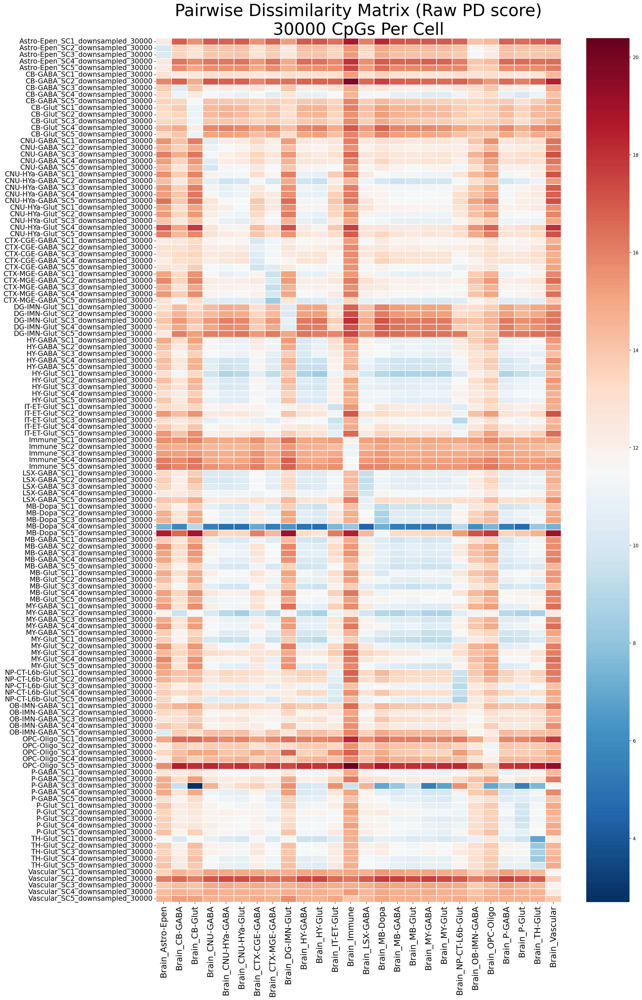

In [8]:
# Plot heatmaps 
n_cpg = '30000'

plt.figure(figsize=(20, 30), dpi=150)
sns.heatmap(split_dfs_renamed[n_cpg], cmap='RdBu_r', linewidths=0.5, yticklabels=True)
plt.title(f'Pairwise Dissimilarity Matrix (Raw PD score)\n{n_cpg} CpGs Per Cell', fontsize=36)

plt.xticks(fontsize=18)
plt.yticks(fontsize=15)
plt.tight_layout()

# Plot Z-score (Row) heatmaps 

In [9]:
# Apply z-score transform to all split DataFrames
split_dfs_renamed_zscore = {}
for k_value, sub_df in split_dfs_renamed.items():
    split_dfs_renamed_zscore[k_value] = sub_df.sub(sub_df.mean(axis=1), axis=0).div(sub_df.std(axis=1), axis=0)

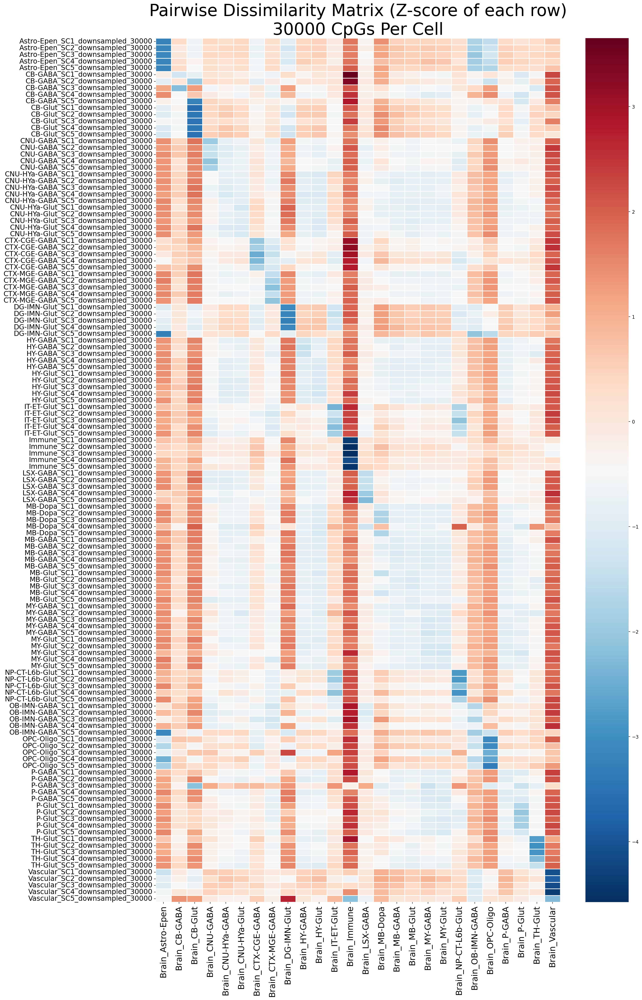

In [10]:
# Plot heatmaps 
n_cpg = '30000'

plt.figure(figsize=(20, 30), dpi=150)

sns.heatmap(split_dfs_renamed_zscore[n_cpg], cmap='RdBu_r', linewidths=0.5, yticklabels=True)
plt.title(f'Pairwise Dissimilarity Matrix (Z-score of each row)\n{n_cpg} CpGs Per Cell', fontsize=36)

plt.xticks(fontsize=18)
plt.yticks(fontsize=15)
plt.tight_layout()

In [11]:
# we want to standardize the color scale for all heatmap subplots for more accurate comparison
print(split_dfs_renamed_zscore['30000'].max().max())
print(split_dfs_renamed_zscore['30000'].min().min())

# set vmin and vmax for all heatmap subplots
vmin, vmax = -4, 4

3.6502016486588844
-4.574525124697375


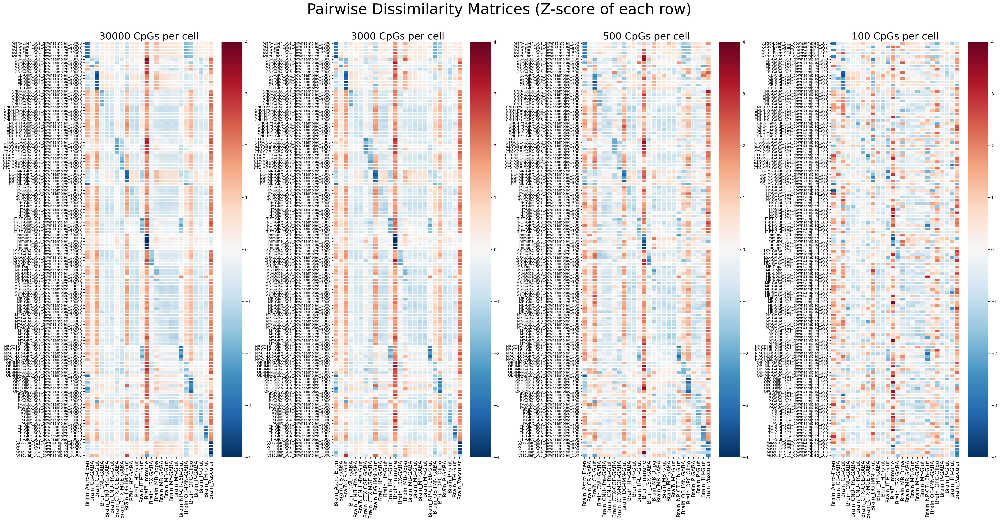

In [12]:
fig, axes = plt.subplots(1, 4, figsize=(34, 18), dpi=150)

# Define the order of your resolutions
resolution_order = ['30000', '3000', '500', '100']

# Plot each DataFrame as a subplot
for i, resolution in enumerate(resolution_order):
    if resolution in split_dfs_renamed_zscore:
        # Select the DataFrame
        df_to_plot = split_dfs_renamed_zscore[resolution]
        
        # Create heatmap on the specific subplot
        sns.heatmap(df_to_plot.iloc[:, :26], 
                   cmap='RdBu_r', 
                   linewidths=0.5, 
                   yticklabels=True,
                   vmin=vmin,
                   vmax=vmax,
                   ax=axes[i])  
        
        # Set title for this subplot
        axes[i].set_title(f'{resolution} CpGs per cell', 
                         fontsize=24)
        
        # Adjust tick sizes
        axes[i].tick_params(axis='x', labelsize=13)
        axes[i].tick_params(axis='y', labelsize=9)

# Add overall title
fig.suptitle(f'Pairwise Dissimilarity Matrices (Z-score of each row)\n', 
             fontsize=36, y=0.98)

plt.tight_layout()
plt.savefig('PD_matrix_zscore_30000_3000_500_100.pdf')
plt.show()

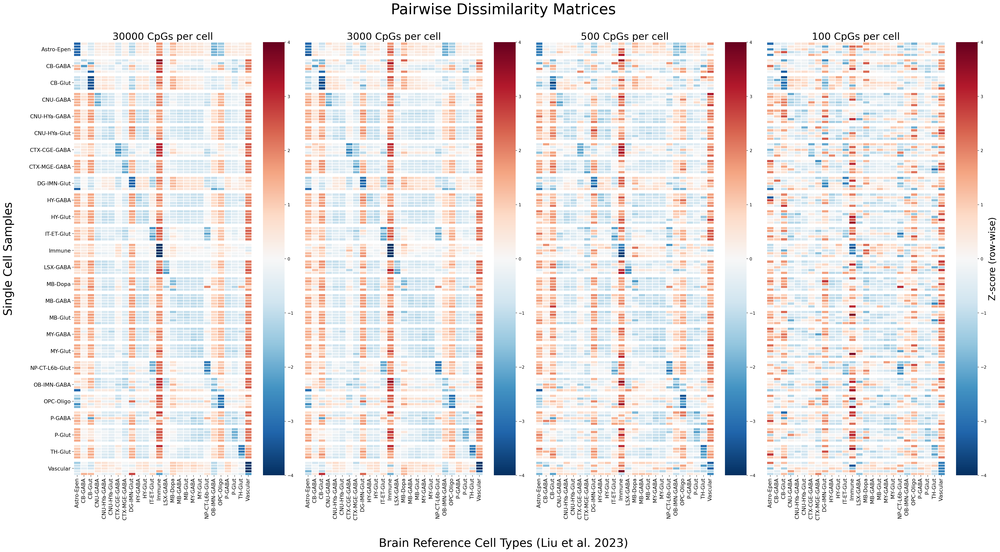

In [13]:
# Custom cmap to make NaNs white (like spacing)
import matplotlib as mpl
cmap = mpl.colormaps['RdBu_r'].copy()
cmap.set_bad(color='white')

fig, axes = plt.subplots(1, 4, figsize=(34, 18), dpi=150)

# Define the order of your resolutions
resolution_order = ['30000', '3000', '500', '100']

# Plot each DataFrame as a subplot
for i, resolution in enumerate(resolution_order):
    if resolution in split_dfs_renamed_zscore:
        # Select the DataFrame
        df_original = split_dfs_renamed_zscore[resolution]
        
        # Insert NaN rows for spacing every 5 rows
        step = 5
        gap_size = 1  # Thickness of the spacing (number of NaN rows)
        groups = [df_original.iloc[j:j + step] for j in range(0, len(df_original), step)]
        nan_df = pd.DataFrame(np.nan, index=range(gap_size), columns=df_original.columns)
        
        inserted = []
        for k, group in enumerate(groups):
            inserted.append(group)
            if k < len(groups) - 1:
                inserted.append(nan_df)
        
        df_to_plot = pd.concat(inserted, ignore_index=True)
        
        # Create heatmap on the specific subplot
        sns.heatmap(df_to_plot.iloc[:, :26], 
                    cmap=cmap, 
                    linewidths=0.5, 
                    yticklabels=False,  # No default labels
                    vmin=vmin,
                    vmax=vmax,
                    ax=axes[i])  
        
        # Add colorbar title only for the rightmost subplot
        if i == 3:
            axes[i].collections[0].colorbar.set_label('Z-score (row-wise)', fontsize=22)
        
        # Custom x-tick labels (processed) for all plots
        original_x_labels = df_original.columns[:26]
        processed_x_labels = [label.replace('Brain_', ' ') for label in original_x_labels]
        axes[i].set_xticklabels(processed_x_labels, rotation=90)
        
        # Custom y-ticks only for the leftmost plot
        if i == 0:
            tick_positions = []
            tick_labels = []
            current_pos = 0
            for k, group in enumerate(groups):
                group_len = len(group)
                center_pos = current_pos + group_len / 2.0
                tick_positions.append(center_pos)
                mid_idx = group_len // 2
                original_label = group.index[mid_idx]
                processed_label = original_label.split('_')[0].replace('_', ' ')
                tick_labels.append(processed_label)
                current_pos += group_len
                if k < len(groups) - 1:
                    current_pos += gap_size
            
            axes[i].set_yticks(tick_positions)
            axes[i].set_yticklabels(tick_labels)
        else:
            axes[i].set_yticks([])  # Remove y-ticks for other plots
        
        # Set title for this subplot
        axes[i].set_title(f'{resolution} CpGs per cell', fontsize=24)
        
        # Adjust tick sizes
        axes[i].tick_params(axis='x', labelsize=13)
        axes[i].tick_params(axis='y', labelsize=13)

# Add overall title
fig.suptitle(f'Pairwise Dissimilarity Matrices\n', fontsize=36, y=0.98)

# Add axis titles
axes[0].set_ylabel("Single Cell Samples\n", fontsize=28)
fig.text(0.5, -0.02, "\nBrain Reference Cell Types (Liu et al. 2023)", ha='center', va='center', fontsize=28)

plt.tight_layout()
plt.savefig('PD_matrix_zscore_30000_3000_500_100.pdf', bbox_inches='tight')
plt.show()

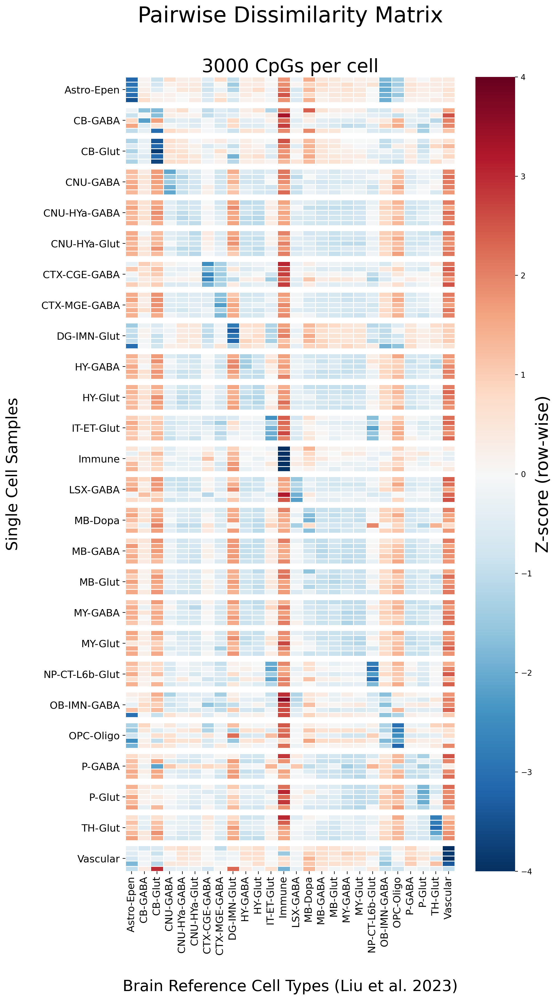

In [14]:
# Custom cmap to make NaNs white (like spacing)
import matplotlib as mpl
cmap = mpl.colormaps['RdBu_r'].copy()
cmap.set_bad(color='white')

fig, ax = plt.subplots(figsize=(10, 18), dpi=200)

# Select resolution
resolution = '3000'
df_original = split_dfs_renamed_zscore[resolution]

# Insert NaN rows for spacing every 5 rows
step = 5
gap_size = 1  # Thickness of the spacing (number of NaN rows)
groups = [df_original.iloc[j:j + step] for j in range(0, len(df_original), step)]
nan_df = pd.DataFrame(np.nan, index=range(gap_size), columns=df_original.columns)

inserted = []
for k, group in enumerate(groups):
    inserted.append(group)
    if k < len(groups) - 1:
        inserted.append(nan_df)

df_to_plot = pd.concat(inserted, ignore_index=True)

# Create heatmap
sns.heatmap(df_to_plot.iloc[:, :26], 
            cmap=cmap, 
            linewidths=0.5, 
            yticklabels=False,  # No default labels
            vmin=vmin,
            vmax=vmax,
            ax=ax)  

# Add colorbar title
ax.collections[0].colorbar.set_label('Z-score (row-wise)', fontsize=22)

# Custom x-tick labels (processed)
original_x_labels = df_original.columns[:26]
processed_x_labels = [label.replace('Brain_', ' ') for label in original_x_labels]
ax.set_xticklabels(processed_x_labels, rotation=90)

# Custom y-ticks with cell type names
tick_positions = []
tick_labels = []
current_pos = 0
for k, group in enumerate(groups):
    group_len = len(group)
    center_pos = current_pos + group_len / 2.0
    tick_positions.append(center_pos)
    mid_idx = group_len // 2
    original_label = group.index[mid_idx]
    processed_label = original_label.split('_')[0].replace('_', ' ')
    tick_labels.append(processed_label)
    current_pos += group_len
    if k < len(groups) - 1:
        current_pos += gap_size

ax.set_yticks(tick_positions)
ax.set_yticklabels(tick_labels)

# Set title
ax.set_title(f'{resolution} CpGs per cell', fontsize=24)

# Adjust tick sizes
ax.tick_params(axis='x', labelsize=13)
ax.tick_params(axis='y', labelsize=13)

# Add axis labels
ax.set_ylabel("Single Cell Samples\n", fontsize=20)
ax.set_xlabel("\nBrain Reference Cell Types (Liu et al. 2023)", fontsize=20)

# Add overall title
fig.suptitle(f'    Pairwise Dissimilarity Matrix\n', fontsize=28, y=0.99)

plt.tight_layout()
plt.savefig('PD_matrix_zscore_3000.pdf', bbox_inches='tight')
plt.show()


# Caculate Accuracy

In [15]:
def calculate_assignment_accuracy(df_renamed_zscore, zscore_threshold=0):
    
    # Filter out rows with NAs
    initial_rows = len(df_renamed_zscore)
    df_clean = df_renamed_zscore.dropna()
    removed_rows = initial_rows - len(df_clean)

    if removed_rows > 0:
        print(f"Removed {removed_rows} samples with NAs")

    assignment_df = pd.DataFrame({
        'assigned_celltype': df_clean.idxmin(axis=1),
        'min_z_score': df_clean.min(axis=1)
    })

    # remove suffix
    assignment_df['sc_celltype'] = [sc.split('_')[0] for sc in assignment_df.index]
    
    # remove prefix organ name
    assignment_df['assigned_celltype_short'] = [sc.split('_')[1] for sc in assignment_df['assigned_celltype']]

    # Assign match: True/False for threshold-passing rows, NaN otherwise
    assignment_df['match'] = assignment_df.apply(
        lambda row: row['sc_celltype'] == row['assigned_celltype_short'] if row['min_z_score'] < zscore_threshold else np.nan,
        axis=1
    )
    
    # Calculate metrics
    total_rows = len(assignment_df)
    not_assigned = assignment_df['match'].isna().sum()
    assigned = total_rows - not_assigned

    # Accuracy and error for assigned rows
    if assigned > 0:
        assigned_rows = assignment_df[assignment_df['match'].notna()]
        accuracy = assigned_rows['match'].mean() * 100  # % of True among assigned
    else:
        accuracy = 0.0


    # Pass percentage
    pass_percentage = (assigned / total_rows) * 100 if total_rows > 0 else 0.0
    
    return accuracy, pass_percentage, assignment_df

In [16]:
results = []

for n_cpg, df in split_dfs_renamed_zscore.items():
    for zscore_threshold in [0, -0.5, -1, -1.1, -1.2, -1.3, -1.4, -1.5, -1.8, -2]:
    
        accuracy, pass_percentage, assignment_df = calculate_assignment_accuracy(df, zscore_threshold=zscore_threshold)
        
        results.append({
            'n_cpg': n_cpg,
            'accuracy': accuracy,
            'z_score': zscore_threshold,
            'pass_percentage': pass_percentage
        })
            
results_df = pd.DataFrame(results)
results_df.head()

,n_cpg,accuracy,z_score,pass_percentage
0,100,36.153846,0.0,100.000000
1,100,36.153846,-0.5,100.000000
2,100,37.096774,-1.0,95.384615
3,100,37.815126,-1.1,91.538462
4,100,40.566038,-1.2,81.538462


In [17]:
results_df[results_df['z_score'] == -1.1]

,n_cpg,accuracy,z_score,pass_percentage
3,100,37.815126,-1.1,91.538462
13,300,56.140351,-1.1,87.692308
23,500,63.865546,-1.1,91.538462
33,1000,72.321429,-1.1,86.153846
43,3000,81.730769,-1.1,80.000000
53,5000,83.495146,-1.1,79.230769
63,10000,83.495146,-1.1,79.230769
73,30000,85.294118,-1.1,78.461538


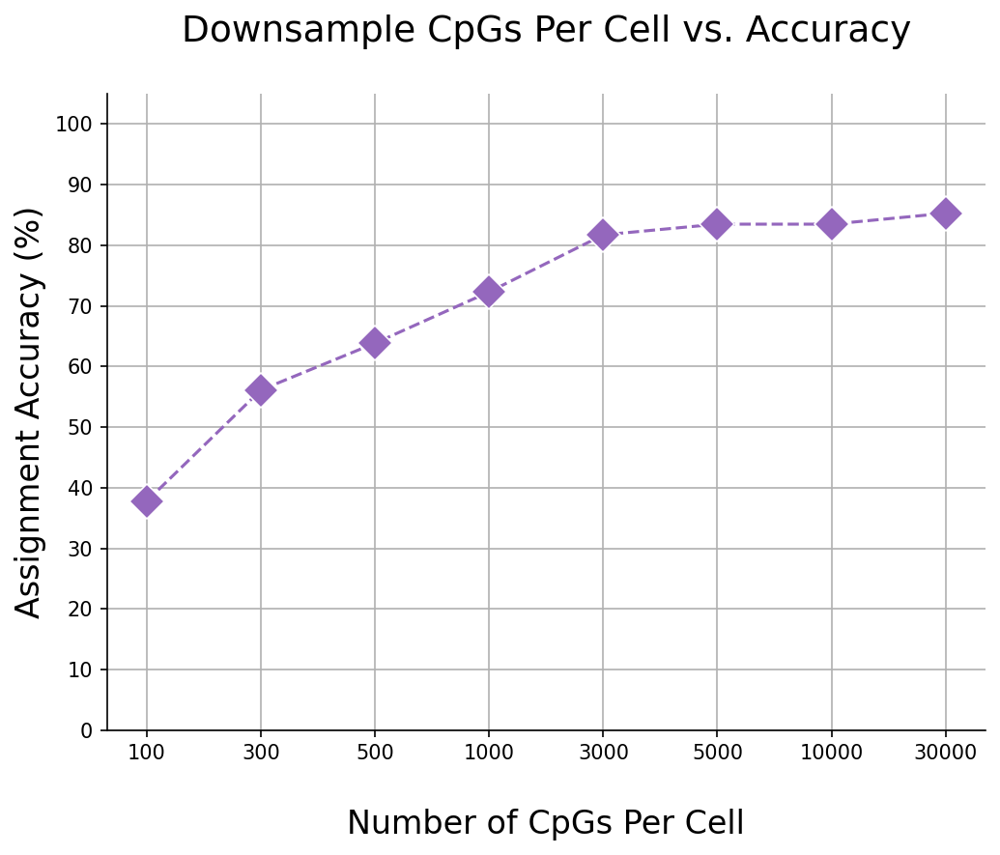

In [18]:
fig, ax = plt.subplots(figsize=(7, 6), dpi=150)

sns.lineplot(
    data=results_df[results_df['z_score'] == -1.1],
    x='n_cpg',
    y='accuracy',
    color='tab:purple',
    marker='D',
    markersize=12,
    linestyle='--',
    ax=ax
)

ax.set_xlabel('\nNumber of CpGs Per Cell', fontsize=16)
ax.set_ylabel('Assignment Accuracy (%)', fontsize=16)
ax.set_title(f'Downsample CpGs Per Cell vs. Accuracy\n', fontsize=18)
ax.set_ylim(0, 105)
ax.set_yticks(np.arange(0, 106, 10))
ax.grid(True)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.savefig('Accuracy_vs_nCpG_zscore_threshold_11.pdf', bbox_inches='tight')
plt.tight_layout()
plt.show()

In [19]:
# look at one example to see the worng assignments
accuracy, pass_percentage, assignment_df = calculate_assignment_accuracy(split_dfs_renamed_zscore['30000'], zscore_threshold=-1.1)
assignment_df.query('match == False')

,assigned_celltype,min_z_score,sc_celltype,assigned_celltype_short,match
CB-GABA_SC2_downsampled_30000,Brain_CB-Glut,-1.984009,CB-GABA,CB-Glut,False
CB-GABA_SC4_downsampled_30000,Brain_P-Glut,-1.294905,CB-GABA,P-Glut,False
CB-GABA_SC5_downsampled_30000,Brain_CB-Glut,-3.246237,CB-GABA,CB-Glut,False
DG-IMN-Glut_SC5_downsampled_30000,Brain_Astro-Epen,-3.262146,DG-IMN-Glut,Astro-Epen,False
IT-ET-Glut_SC2_downsampled_30000,Brain_NP-CT-L6b-Glut,-1.411089,IT-ET-Glut,NP-CT-L6b-Glut,False
IT-ET-Glut_SC3_downsampled_30000,Brain_NP-CT-L6b-Glut,-2.118226,IT-ET-Glut,NP-CT-L6b-Glut,False
MB-Dopa_SC4_downsampled_30000,Brain_LSX-GABA,-1.313508,MB-Dopa,LSX-GABA,False
MB-Glut_SC1_downsampled_30000,Brain_MB-Dopa,-1.422461,MB-Glut,MB-Dopa,False
MB-Glut_SC4_downsampled_30000,Brain_MB-Dopa,-1.224648,MB-Glut,MB-Dopa,False
MY-Glut_SC4_downsampled_30000,Brain_CTX-MGE-GABA,-1.136302,MY-Glut,CTX-MGE-GABA,False


/tmp/ipykernel_1326/562483469.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(accuracy_by_celltype.index, rotation=55, ha='right', fontsize=14)


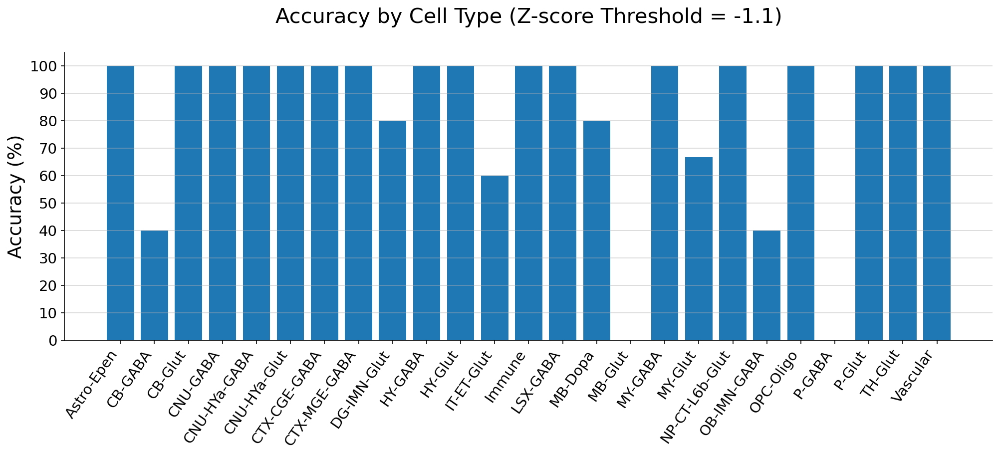

In [20]:
# calculate accuracy by cell type, drop na
accuracy_by_celltype = assignment_df.dropna().groupby('sc_celltype')['match'].mean() * 100

fig, ax = plt.subplots(figsize=(16,5), dpi=150)

ax.bar(accuracy_by_celltype.index, accuracy_by_celltype.values, color="tab:blue")

ax.set_xticklabels(accuracy_by_celltype.index, rotation=55, ha='right', fontsize=14)
ax.tick_params(axis='y', which='major', labelsize=14)
ax.set_title("Accuracy by Cell Type (Z-score Threshold = -1.1)\n", fontsize=20)
ax.set_ylabel("Accuracy (%)", fontsize=18)

ax.set_ylim(0,105)
ax.set_yticks(np.arange(0, 106, 10))

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.grid(True, axis='y', alpha=0.5)

plt.show()

# Accuracy vs. Z-score Threshold vs Pass Percentage

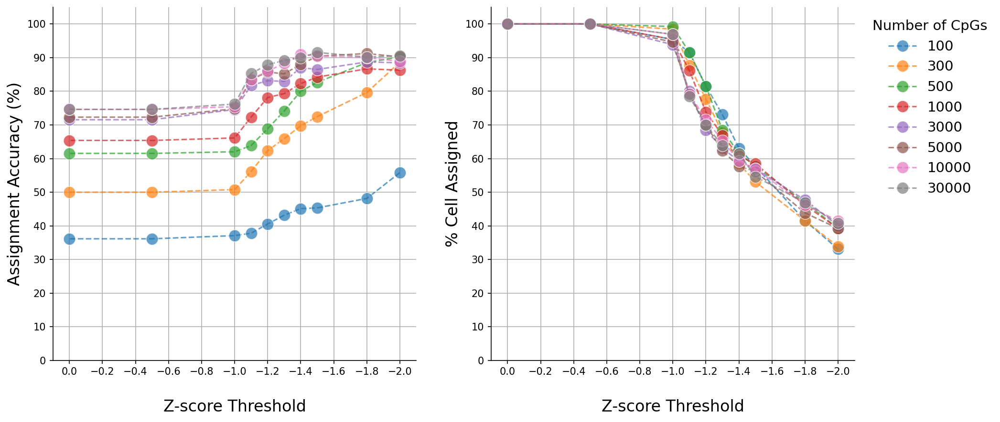

In [21]:
# Create figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=150)

# Define metrics for each subplot
metrics = [
    ('accuracy', 'Assignment Accuracy (%)', 'Assignment Accuracy vs. Z-score Threshold'),
    ('pass_percentage', '\n% Cell Assigned', '% Cell Assigned vs. Z-score Threshold')
]

for i, (y, ylabel, title) in enumerate(metrics):
    ax = axes[i]
    sns.lineplot(
        data=results_df,
        x='z_score',
        y=y,
        hue='n_cpg',
        palette='tab10',
        marker='o',
        markersize=12,
        alpha=0.7,
        linestyle='--',
        ax=ax
    )
    ax.set_xlabel('\nZ-score Threshold', fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    #ax.set_title(title, fontsize=16)
    
    ax.set_ylim(0, 105)
    ax.set_yticks(np.arange(0, 106, 10))
    ax.set_xlim(-2.1, 0.1)
    ax.set_xticks(np.arange(-2, 0.1, 0.2))
    ax.grid(True)
    ax.invert_xaxis()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# keep right legend only
axes[0].get_legend().remove()
axes[1].legend(title='Number of CpGs', fontsize=14, title_fontsize=14, loc='upper right', bbox_to_anchor=(1.4, 1.0), frameon=False)

plt.tight_layout()
plt.savefig('Accuracy_vs_zscore_and_percent_cell_assigned.pdf')
plt.show()

In [22]:
results_df.query('n_cpg == "3000"')

,n_cpg,accuracy,z_score,pass_percentage
40,3000,71.538462,0.0,100.000000
41,3000,71.538462,-0.5,100.000000
42,3000,74.590164,-1.0,93.846154
43,3000,81.730769,-1.1,80.000000
44,3000,83.146067,-1.2,68.461538
45,3000,82.926829,-1.3,63.076923
46,3000,87.012987,-1.4,59.230769
47,3000,86.486486,-1.5,56.923077
48,3000,88.709677,-1.8,47.692308
49,3000,88.461538,-2.0,40.000000


# Compare mapping to ChromHMM open states
- Process large reference data is time consuming, so we test if smaller but biological relevant regions is sufficent
- We use the ChromHMM annotated open states and intersect with the reference data
- See Vu et al. 2023 https://doi.org/10.1186/s13059-023-02994-x
- See *processing_summary.txt* for processing time after running *RETrace2/modules/infer_celltype/calculate_pd_matrix_batched.py*

In [23]:
# Manaul add results for plotting
states_df = pd.DataFrame({'Name':['Whole Genome', 'ChromHMM\nOpen States', 'ChromHMM\nPromoter+Enhancer'],
 'Region':['no_filter', 'ChromHMM_open', 'ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm'],
 'Accuracy':[92, 85.86, 85.71],
 'Processing_Time_Hr':[3.74, 2.11, 0.9] 
 })

states_df

,Name,Region,Accuracy,Processing_Time_Hr
0,Whole Genome,no_filter,92.00,3.74
1,ChromHMM\nOpen States,ChromHMM_open,85.86,2.11
2,ChromHMM\nPromoter+Enhancer,ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm,85.71,0.90


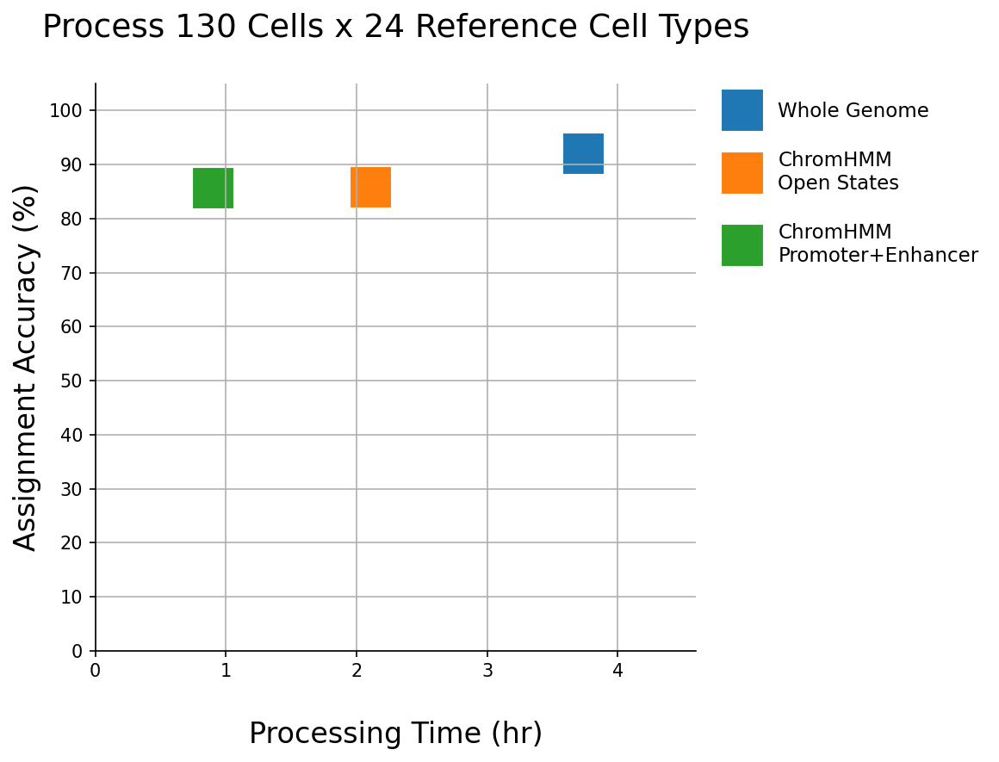

In [24]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=150)

sns.scatterplot(
    data=states_df,
    x='Processing_Time_Hr',
    y='Accuracy',
    hue='Name',
    palette='tab10',  
    s=600,
    marker='s',
    ax=ax
)

ax.set_xlabel('\nProcessing Time (hr)', fontsize=16)
ax.set_ylabel('Assignment Accuracy (%)', fontsize=16)
ax.set_title(f'Process 130 Cells x 24 Reference Cell Types\n', fontsize=18)
ax.set_xlim(0, 4.6)
ax.set_ylim(0, 105)
ax.set_yticks(np.arange(0, 106, 10))
ax.grid(True)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.legend(title='', fontsize=11, loc='upper right', labelspacing=1.5, bbox_to_anchor=(1.5, 1.0), frameon=False)


plt.tight_layout()
plt.savefig('ChromHMM_Processing_Time.pdf', bbox_inches='tight')

plt.show()

# Plot N Shared Sites

In [25]:
# Load shared sites matrix
shared_sites_file = '/home/tcheng/Projects/RETrace/Methylation_ref/Test_data/Liu2023_Brain/2_calc_pd_matrix/test_pd_matrix_intersect_retrace2_ChromHMM_mTSS_mEnhA_mEnhWk_mBivProm_5cells_v2/shared_sites_matrix.csv'
shared_sites = pd.read_csv(shared_sites_file, index_col=0)
shared_sites.head()

,Brain_Astro-Epen,Brain_CB-GABA,Brain_CB-Glut,Brain_CNU-GABA,Brain_CNU-HYa-GABA,Brain_CNU-HYa-Glut,Brain_CTX-CGE-GABA,Brain_CTX-MGE-GABA,Brain_DG-IMN-Glut,Brain_HY-GABA,...,Brain_MB-Glut,Brain_MY-GABA,Brain_MY-Glut,Brain_NP-CT-L6b-Glut,Brain_OB-IMN-GABA,Brain_OPC-Oligo,Brain_P-GABA,Brain_P-Glut,Brain_TH-Glut,Brain_Vascular
GSM3761935_downsampled_100,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,...,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0,58.0
GSM3761935_downsampled_1000,563.0,563.0,563.0,562.0,562.0,562.0,562.0,563.0,562.0,563.0,...,563.0,563.0,563.0,562.0,562.0,563.0,563.0,563.0,563.0,563.0
GSM3761935_downsampled_10000,5457.0,5460.0,5461.0,5453.0,5451.0,5452.0,5457.0,5460.0,5459.0,5459.0,...,5461.0,5461.0,5461.0,5453.0,5452.0,5460.0,5461.0,5461.0,5461.0,5456.0
GSM3761935_downsampled_300,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,...,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0,167.0
GSM3761935_downsampled_3000,1622.0,1623.0,1623.0,1621.0,1622.0,1621.0,1622.0,1623.0,1623.0,1623.0,...,1623.0,1623.0,1623.0,1622.0,1622.0,1623.0,1623.0,1623.0,1623.0,1622.0


In [26]:
patterns = ['100', '300', '500', '1000', '3000', '5000', '10000', '30000']
shared_sites_split_dfs = {}

for pattern in patterns:
    mask = shared_sites.index.str.contains(f'_{pattern}\\b', case=False) # use word boundary to ensure exact match
    shared_sites_split_dfs[pattern] = shared_sites[mask]

In [27]:
# Apply to all split DataFrames
shared_sites_split_dfs_renamed = {}
for k_value, sub_df in shared_sites_split_dfs.items():
    shared_sites_split_dfs_renamed[k_value] = rename_index_with_metadata(sub_df, metadata)

In [28]:
# Select the brain reference 1-24 columns 
for n_cpg, df in shared_sites_split_dfs_renamed.items():
    shared_sites_split_dfs_renamed[n_cpg] = df.iloc[:, :24]

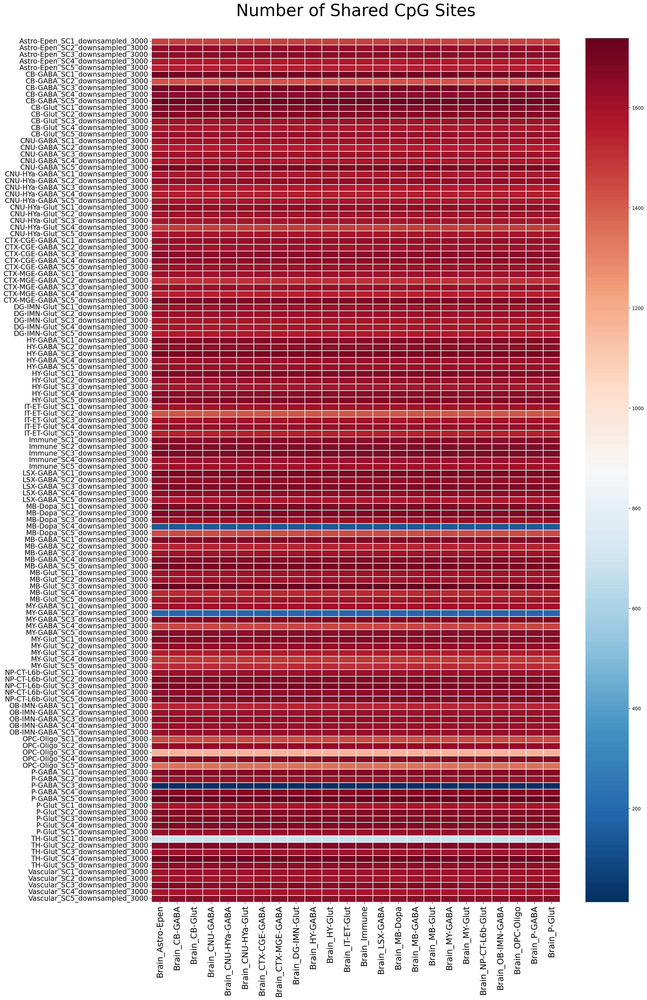

In [29]:
# Plot heatmaps 
plt.figure(figsize=(20, 30), dpi=150)
sns.heatmap(shared_sites_split_dfs_renamed['3000'], cmap='RdBu_r', linewidths=0.5, yticklabels=True)
plt.title('Number of Shared CpG Sites\n', fontsize=36)

plt.xticks(fontsize=18)
plt.yticks(fontsize=15)
plt.tight_layout()

# For Publication Figure 1 schematic

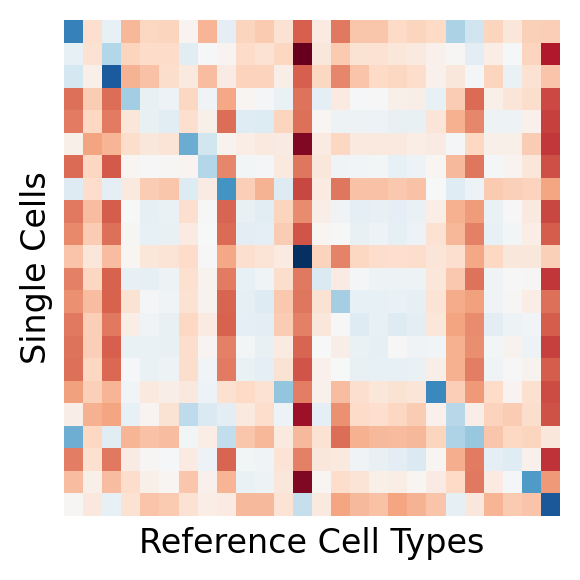

In [30]:
plt.figure(figsize=(3, 3), dpi=200)

heatmap = sns.heatmap(split_dfs_renamed_zscore['3000'].iloc[::6], cmap='RdBu_r')

# Remove x and y tick labels
plt.tick_params(
    axis='both',          # Apply to both x and y axes
    which='both',         # Apply to both major and minor ticks
    bottom=False,         # Remove bottom ticks
    left=False,           # Remove left ticks
    labelbottom=False,    # Remove x-axis tick labels
    labelleft=False      # Remove y-axis tick labels
)

heatmap.set_xlabel('Reference Cell Types', fontsize=12)
heatmap.set_ylabel('Single Cells', fontsize=12)

# Remove the color bar
heatmap.collections[0].colorbar.remove()

plt.tight_layout()
plt.savefig('Fig1_pdmatrix_schematic.pdf')
plt.show()

# For Presentation Slide

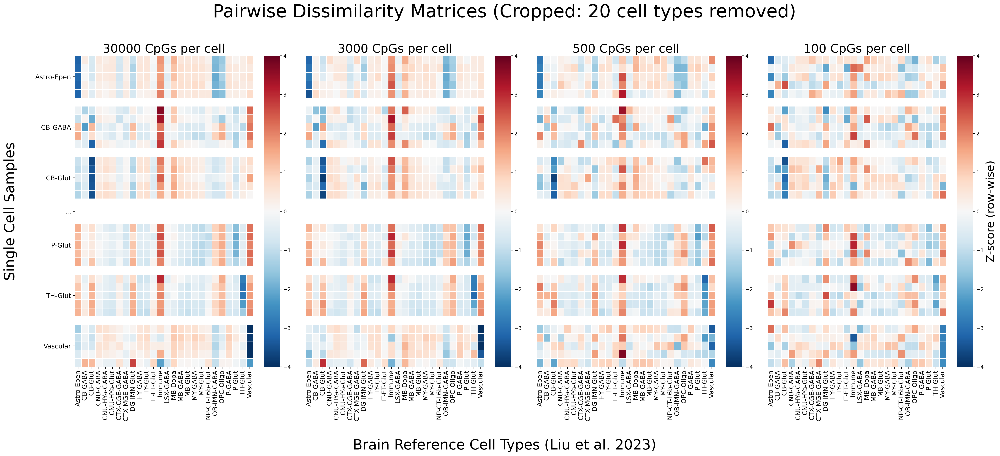


✓ Cropped heatmap saved!
  - Kept top 3 and bottom 3 cell type groups
  - Removed 20 middle groups


In [34]:
# ============================================================================
# CROPPED HEATMAP PLOT - For Slide Presentations
# ============================================================================
# Adjust these parameters to control which rows to keep:
#   - top_groups: number of cell type groups to keep at the top
#   - bottom_groups: number of cell type groups to keep at the bottom
#   - The middle groups will be cropped out with a visual break indicator
# ============================================================================

# Parameters - adjust these to control cropping
top_groups = 3       # Number of cell type groups to keep at the top
bottom_groups = 3    # Number of cell type groups to keep at the bottom
break_gap_size = 3   # Thickness of the break indicator gap

# Custom cmap to make NaNs white (like spacing)
import matplotlib as mpl
cmap = mpl.colormaps['RdBu_r'].copy()
cmap.set_bad(color='white')

fig, axes = plt.subplots(1, 4, figsize=(28, 12), dpi=200)  # Reduced height

# Define the order of your resolutions
resolution_order = ['30000', '3000', '500', '100']

# Track cropping info for the title
total_groups = 0
is_cropped = False

# Plot each DataFrame as a subplot
for i, resolution in enumerate(resolution_order):
    if resolution in split_dfs_renamed_zscore:
        # Select the DataFrame
        df_original = split_dfs_renamed_zscore[resolution]
        
        # Split into groups of 5 rows (matching original grouping)
        step = 5
        gap_size = 1  # Thickness of the spacing (number of NaN rows)
        all_groups = [df_original.iloc[j:j + step] for j in range(0, len(df_original), step)]
        
        # Create cropped groups: top + break + bottom
        total_groups = len(all_groups)
        nan_df = pd.DataFrame(np.nan, index=range(gap_size), columns=df_original.columns)
        
        if total_groups > top_groups + bottom_groups:
            is_cropped = True
            # Get top and bottom groups
            top_section = all_groups[:top_groups]
            bottom_section = all_groups[-bottom_groups:]
            
            # Create a "break" row to indicate cropped content
            nan_break = pd.DataFrame(np.nan, index=range(break_gap_size), columns=df_original.columns)
            
            # Build the dataframe with spacing
            inserted = []
            
            for k, group in enumerate(top_section):
                inserted.append(group)
                if k < len(top_section) - 1:
                    inserted.append(nan_df)
            
            # Add break indicator (thicker gap)
            inserted.append(nan_break)
            
            for k, group in enumerate(bottom_section):
                inserted.append(group)
                if k < len(bottom_section) - 1:
                    inserted.append(nan_df)
            
            df_to_plot = pd.concat(inserted, ignore_index=True)
        else:
            is_cropped = False
            # If not enough groups to crop, use all groups
            top_section = all_groups[:top_groups]
            bottom_section = all_groups[-bottom_groups:] if len(all_groups) > top_groups else []
            
            inserted = []
            for k, group in enumerate(all_groups):
                inserted.append(group)
                if k < len(all_groups) - 1:
                    inserted.append(nan_df)
            df_to_plot = pd.concat(inserted, ignore_index=True)
        
        # Create heatmap on the specific subplot
        sns.heatmap(df_to_plot.iloc[:, :26], 
                    cmap=cmap, 
                    linewidths=0.5, 
                    yticklabels=False,  # No default labels
                    vmin=vmin,
                    vmax=vmax,
                    ax=axes[i])  
        
        # Add colorbar title only for the rightmost subplot
        if i == 3:
            axes[i].collections[0].colorbar.set_label('Z-score (row-wise)', fontsize=22)
        
        # Custom x-tick labels (processed) for all plots
        original_x_labels = df_original.columns[:26]
        processed_x_labels = [label.replace('Brain_', ' ') for label in original_x_labels]
        axes[i].set_xticklabels(processed_x_labels, rotation=90)
        
        # Custom y-ticks only for the leftmost plot
        if i == 0:
            tick_positions = []
            tick_labels = []
            current_pos = 0
            
            # Top section labels
            for k, group in enumerate(top_section):
                group_len = len(group)
                center_pos = current_pos + group_len / 2.0
                tick_positions.append(center_pos)
                mid_idx = group_len // 2
                original_label = group.index[mid_idx]
                processed_label = original_label.split('_')[0].replace('_', ' ')
                tick_labels.append(processed_label)
                current_pos += group_len
                current_pos += gap_size
            
            # Add break indicator position (if cropped)
            if is_cropped:
                # Add "..." label in the break area
                break_center = current_pos + break_gap_size / 2.0 - gap_size
                tick_positions.append(break_center)
                tick_labels.append("...")
                current_pos += break_gap_size - gap_size
            
            # Bottom section labels
            for k, group in enumerate(bottom_section):
                group_len = len(group)
                center_pos = current_pos + group_len / 2.0
                tick_positions.append(center_pos)
                mid_idx = group_len // 2
                original_label = group.index[mid_idx]
                processed_label = original_label.split('_')[0].replace('_', ' ')
                tick_labels.append(processed_label)
                current_pos += group_len
                if k < len(bottom_section) - 1:
                    current_pos += gap_size
            
            axes[i].set_yticks(tick_positions)
            axes[i].set_yticklabels(tick_labels)
        else:
            axes[i].set_yticks([])  # Remove y-ticks for other plots
        
        # Set title for this subplot
        axes[i].set_title(f'{resolution} CpGs per cell', fontsize=24)
        
        # Adjust tick sizes
        axes[i].tick_params(axis='x', labelsize=13)
        axes[i].tick_params(axis='y', labelsize=13)

# Add overall title
n_cropped = total_groups - top_groups - bottom_groups if is_cropped else 0
fig.suptitle(f'Pairwise Dissimilarity Matrices (Cropped: {n_cropped} cell types removed)\n', fontsize=36, y=0.98)

# Add axis titles
axes[0].set_ylabel("Single Cell Samples\n", fontsize=28)
fig.text(0.5, -0.02, "\nBrain Reference Cell Types (Liu et al. 2023)", ha='center', va='center', fontsize=28)

plt.tight_layout()
plt.savefig(f'PD_matrix_zscore_CROPPED_top{top_groups}_bottom{bottom_groups}.pdf', bbox_inches='tight')
plt.show()

print(f"\n✓ Cropped heatmap saved!")
print(f"  - Kept top {top_groups} and bottom {bottom_groups} cell type groups")
print(f"  - Removed {n_cropped} middle groups")
